In [2]:
'''
Saving and visualizing attention into one plot. 
'''

'\nSaving and visualizing attention into one plot. \n'

In [1]:
import os
import sys
import argparse
import glob
import cv2
import random
import colorsys
import requests
from io import BytesIO

import skimage.io
from skimage.measure import find_contours
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms as pth_transforms
import numpy as np
from PIL import Image

import utils
import vision_transformer as vits

In [129]:
"""
Helper functions
"""
def apply_mask(image, mask, color, alpha=0.5):
    for c in range(3):
        image[:, :, c] = image[:, :, c] * (1 - alpha * mask) + alpha * mask * color[c] * 255
    return image


def random_colors(N, bright=True):
    """
    Generate random colors.
    """
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    random.shuffle(colors)
    return colors


def display_instances(image, mask, blur=False, contour=True, alpha=0.5):
    N = 1
    mask = mask[None, :, :]
    # Generate random colors
    colors = random_colors(N)
    # Show area outside image boundaries.
    height, width = image.shape[:2]
    margin = 0
    masked_image = image.astype(np.uint32).copy()
    for i in range(N):
        color = colors[i]
        _mask = mask[i]
        if blur:
            _mask = cv2.blur(_mask,(10,10))
        # Mask
        masked_image = apply_mask(masked_image, _mask, color, alpha)
        # Mask Polygon
        # Pad to ensure proper polygons for masks that touch image edges.
        if contour:
            padded_mask = np.zeros((_mask.shape[0] + 2, _mask.shape[1] + 2))
            padded_mask[1:-1, 1:-1] = _mask
            contours = find_contours(padded_mask, 0.5)
            for verts in contours:
                # Subtract the padding and flip (y, x) to (x, y)
                verts = np.fliplr(verts) - 1
                p = Polygon(verts, facecolor="none", edgecolor=color)
    # ax.imshow(masked_image.astype(np.uint8), aspect='auto')
    # fig.savefig(fname)
    # print(f"{fname} saved.")
    return masked_image.astype(np.uint8)

In [17]:
"""
Arguments
"""
arch = 'vit_small'
patch_size = 8
pretrained_weights = '/workspace/dino_deitsmall8_300ep_pretrain.pth'
checkpoint_key = "teacher"
image_folder= "/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/"
output_dir = "./images/ILSVRC2012"
threshold = 0.6

In [24]:
"""
Code block for loading model with pretrained weights
"""
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# ======== preparing model... ======
model = vits.__dict__[arch](patch_size=patch_size, num_classes=0)
for p in model.parameters():
    p.requires_grad = False
model.eval()
model.to(device)

# ======== loading pretrained wieghts... ========
if os.path.isfile(pretrained_weights):
    state_dict = torch.load(pretrained_weights, map_location="cpu")
    if checkpoint_key is not None and checkpoint_key in state_dict:
        print(f"Take key {checkpoint_key} in provided checkpoint dict")
        state_dict = state_dict[checkpoint_key]
    # remove `module.` prefix
    state_dict = {k.replace("module.", ""): v for k, v in state_dict.items()}
    # remove `backbone.` prefix induced by multicrop wrapper
    state_dict = {k.replace("backbone.", ""): v for k, v in state_dict.items()}
    msg = model.load_state_dict(state_dict, strict=False)
    print('Pretrained weights found at {} and loaded with msg: {}'.format(pretrained_weights, msg))

Pretrained weights found at /workspace/dino_deitsmall8_300ep_pretrain.pth and loaded with msg: <All keys matched successfully>


In [15]:
image

['/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00023559.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00017700.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00021740.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00017472.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00026397.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00037861.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00028158.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00013716.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00024235.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00034654.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764/ILSVRC2012_val_00045866.JPEG',
 '/lunit/data/public/imagenet/ILSVRC2012/val/n01440764

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


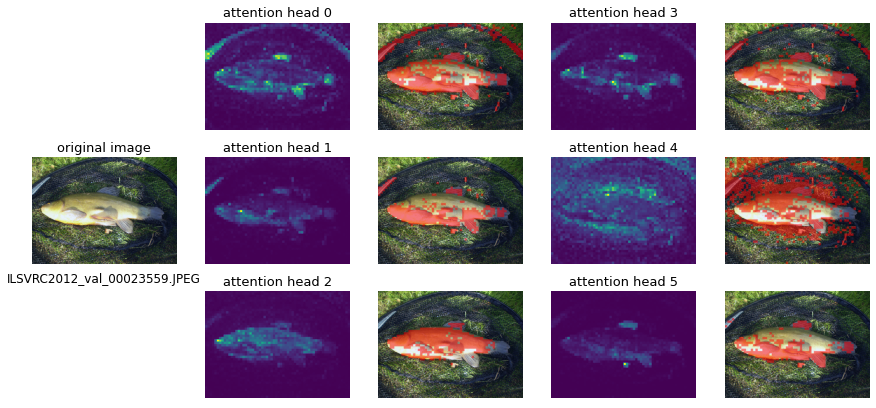

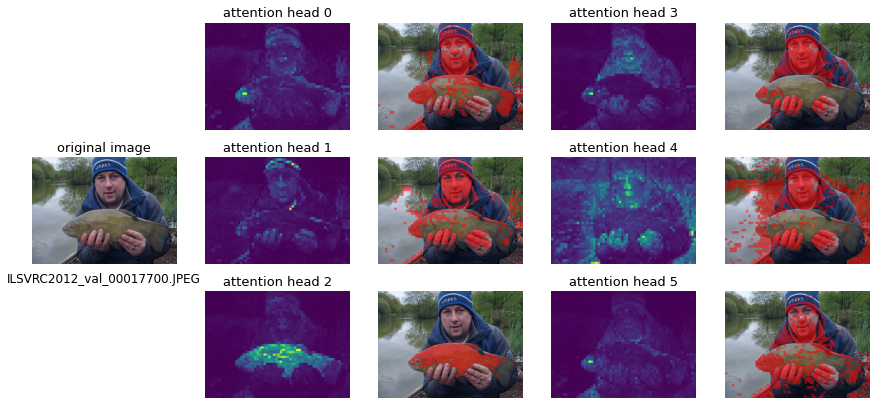

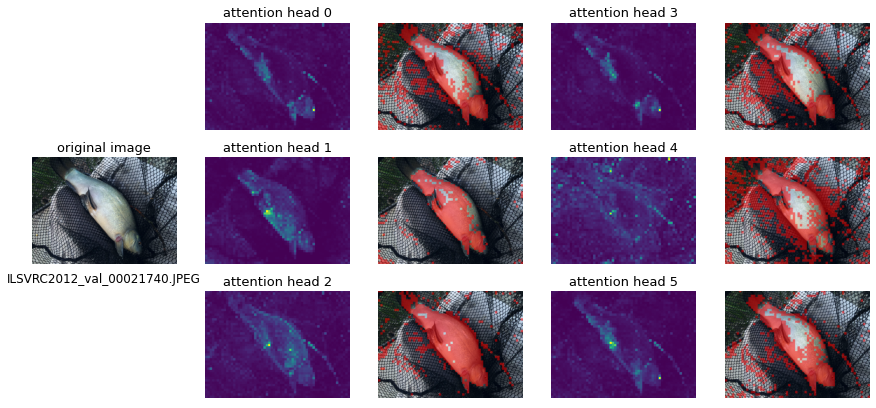

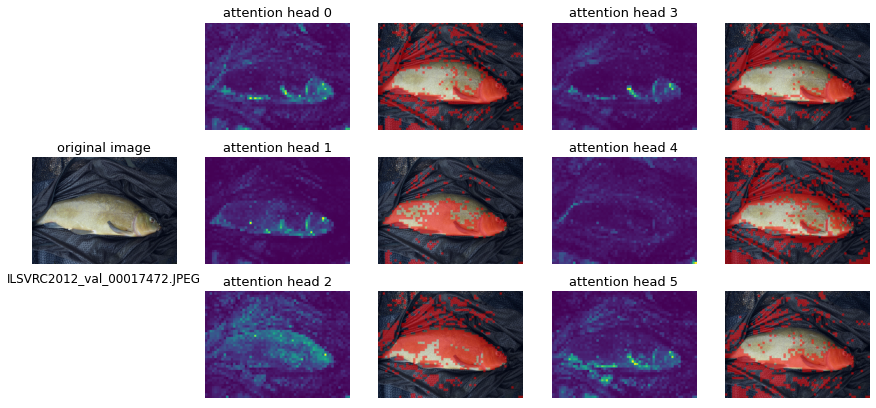

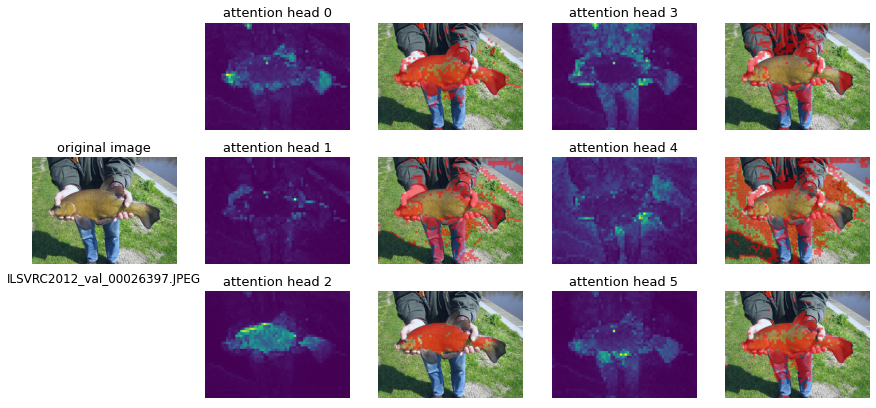

...

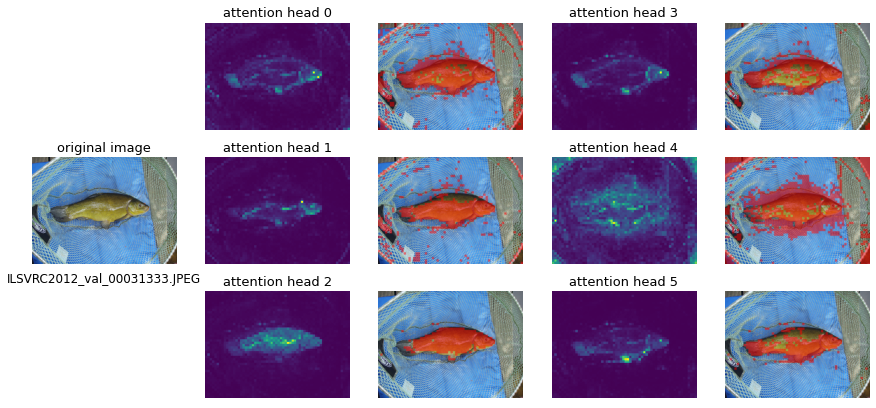

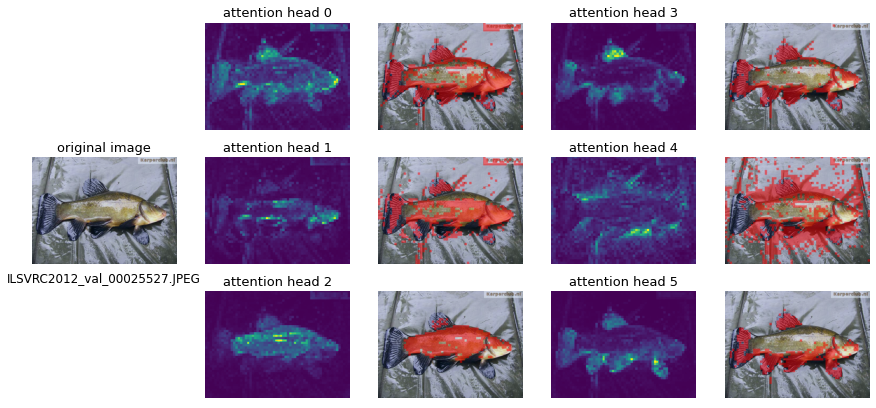

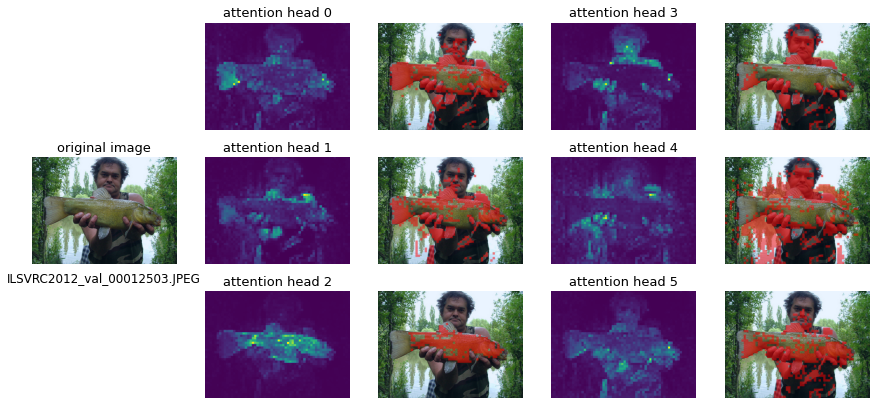

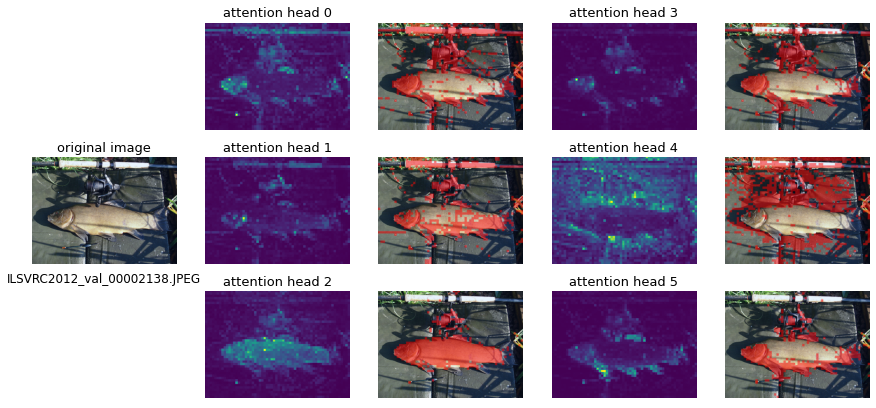

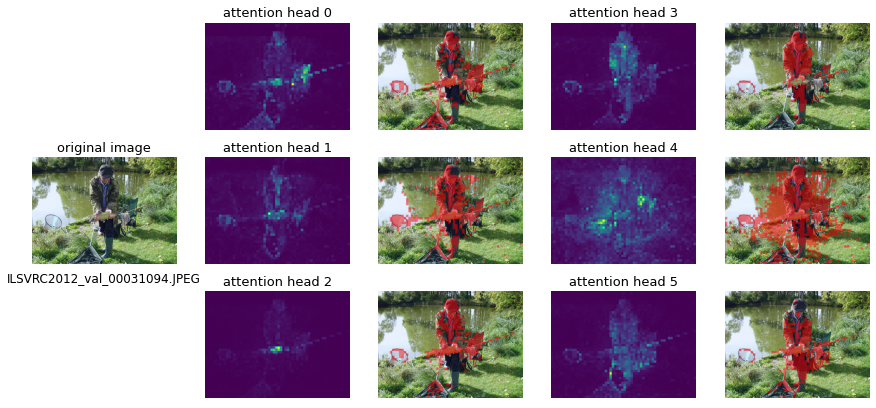

In [207]:
"""
Save plots
"""

transform = pth_transforms.Compose([
    pth_transforms.ToTensor(),
    pth_transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

image_list = glob.glob(image_folder + "*")

for image_path in image_list:
    
    # load image 
    with open(image_path, 'rb') as f:
        img = Image.open(f)
        img = img.convert('RGB')
        
    img = transform(img)
    
    # make the image divisible by the patch size
    w, h = img.shape[1] - img.shape[1] % patch_size, img.shape[2] - img.shape[2] % patch_size
    img = img[:, :w, :h].unsqueeze(0)

    w_featmap = img.shape[-2] // patch_size
    h_featmap = img.shape[-1] // patch_size

    attentions = model.get_last_selfattention(img.to(device))

    nh = attentions.shape[1] # number of head
    
    # we keep only the output patch attention
    attentions = attentions[0, :, 0, 1:].reshape(nh, -1)

    # we keep only a certain percentage of the mass
    val, idx = torch.sort(attentions)
    val /= torch.sum(val, dim=1, keepdim=True)
    cumval = torch.cumsum(val, dim=1)
    th_attn = cumval > (1 - threshold)
    idx2 = torch.argsort(idx)
    for head in range(nh):
        th_attn[head] = th_attn[head][idx2[head]]
    th_attn = th_attn.reshape(nh, w_featmap, h_featmap).float()
    # interpolate
    th_attn = nn.functional.interpolate(th_attn.unsqueeze(0), scale_factor=patch_size, mode="nearest")[0].cpu().numpy()

    attentions = attentions.reshape(nh, w_featmap, h_featmap)
    attentions = nn.functional.interpolate(attentions.unsqueeze(0), scale_factor=patch_size, mode="nearest")[0].cpu().numpy()
    
    fname = os.path.join(output_dir, image_path.replace(image_folder, ""))
    fname = fname.replace("JPEG", 'png')
    
    torchvision.utils.save_image(torchvision.utils.make_grid(img, normalize=True, scale_each=True), "img.png")
    image = skimage.io.imread("img.png")
    
    fig, axs = plt.subplots(3, 5, figsize=(15, 7))
    [axi.set_axis_off() for axi in axs.ravel()]
    axs[1, 0].imshow(image)
    axs[1, 0].set_title("original image", size = 13)
    axs[2, 0].set_title(image_path.replace(image_folder, ""))

    # display attentions 
    for j in range(nh):
        col = int(j/3) + int(j/3)*1 + 1
        axs[(j%3), col].imshow(attentions[j])
        axs[(j%3), col].set_title("attention head " + str(j), size=13)
        test = display_instances(image, th_attn[j], blur=False)
        axs[(j%3), col + 1].imshow(test)
        # axs[(j%3)+ 1, col + 1].set_title("attention head mask " + str(j), size=20, **hfont)

    fig.savefig(fname)
    

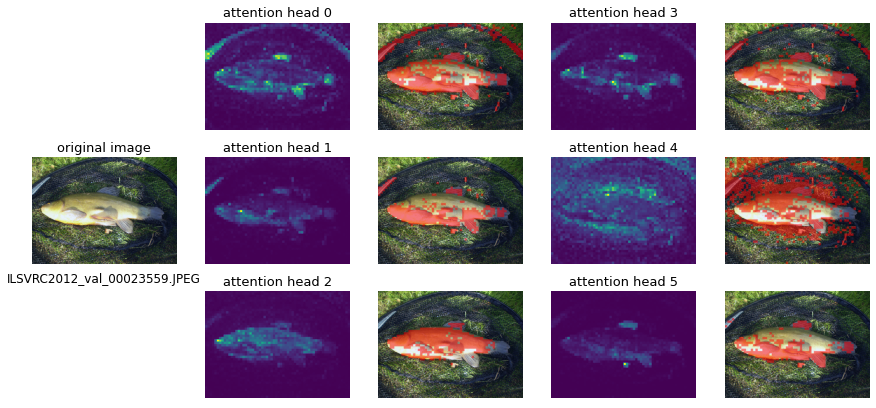

In [202]:
fig, axs = plt.subplots(3, 5, figsize=(15, 7))
[axi.set_axis_off() for axi in axs.ravel()]
axs[1, 0].imshow(image)
axs[1, 0].set_title("original image", size = 13)
axs[2, 0].set_title(image_path.replace(image_folder, ""))

torchvision.utils.save_image(torchvision.utils.make_grid(img, normalize=True, scale_each=True), "img.png")
image = skimage.io.imread("img.png")

# display attentions 
for j in range(nh):
    col = int(j/3) + int(j/3)*1 + 1
    axs[(j%3), col].imshow(attentions[j])
    axs[(j%3), col].set_title("attention head " + str(j), size=13)
    test = display_instances(image, th_attn[j], blur=False)
    axs[(j%3), col + 1].imshow(test)
    # axs[(j%3)+ 1, col + 1].set_title("attention head mask " + str(j), size=20, **hfont)

fig.savefig(fname)